### Importing Libraries

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import pydicom as dicom
import cv2
import ast
from sklearn.metrics import roc_curve, auc, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score
import seaborn as sns
import json
import glob
import random
import collections
import datetime
import tensorflow as tf
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers
from pydicom.pixel_data_handlers.util import apply_voi_lut
import time
import warnings
warnings.filterwarnings("ignore")

### Load dataset path

In [51]:
data_path = '/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/'
os.listdir(data_path)

['sample_submission.csv', 'train_labels.csv', 'test', 'train']

#### Load dataset

In [52]:
training_data = pd.read_csv(data_path+'train_labels.csv')
folder = str(training_data.loc[0, 'BraTS21ID']).zfill(5)

### Data Visualisation

In [53]:
print('Samples train:', len(training_data))

Samples train: 585


In [54]:
training_data.head()

,BraTS21ID,MGMT_value
0,0,1
1,2,1
2,3,0
3,5,1
4,6,1


### MGMT_value counts 

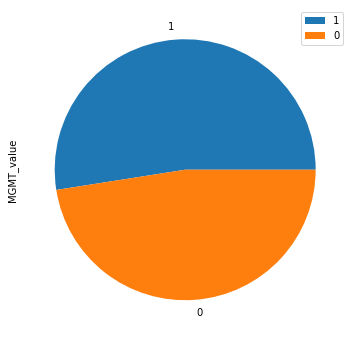

In [55]:
training_data["MGMT_value"].value_counts().head(2).plot(kind = 'pie', figsize=(6, 6)).legend()

In [56]:
training_data["MGMT_value"].value_counts()

1    307
0    278
Name: MGMT_value, dtype: int64

# Read Dicom Files
We consider the first train sample.
```
Training/Validation/Testing
│
└─── 00000
│   │
│   └─── FLAIR
│   │   │ Image-1.dcm
│   │   │ Image-2.dcm
│   │   │ ...
│   │   
│   └─── T1w
│   │   │ Image-1.dcm
│   │   │ Image-2.dcm
│   │   │ ...
│   │   
│   └─── T1wCE
│   │   │ Image-1.dcm
│   │   │ Image-2.dcm
│   │   │ ...
│   │   
│   └─── T2w
│   │   │ Image-1.dcm
│   │   │ Image-2.dcm
│   │   │ .....
│   
└─── 00001
│   │ ...
│   
│ ...   
│   
└─── 00002
│   │ ...
```

### Folders content

In [57]:
os.listdir(data_path+'train/'+folder)

['T2w', 'T1wCE', 'T1w', 'FLAIR']

In [58]:
print('Number of FLAIR images:', len(os.listdir(data_path+'train/'+folder+'/'+'FLAIR')))
print('Number of T1w images:', len(os.listdir(data_path+'train/'+folder+'/'+'T1w')))
print('Number of T1wCE images:', len(os.listdir(data_path+'train/'+folder+'/'+'T1wCE')))
print('Number of T2w images:', len(os.listdir(data_path+'train/'+folder+'/'+'T2w')))

Number of FLAIR images: 400
Number of T1w images: 33
Number of T1wCE images: 129
Number of T2w images: 408


### Read Image from Folder

In [59]:
file_path = ''.join([data_path, 'train/', folder, '/', 'FLAIR/'])
image = os.listdir(file_path)[0]
data_file = dicom.dcmread(file_path+image)
img = data_file.pixel_array

### Image shape

In [60]:
print('Image shape:', img.shape)

Image shape: (512, 512)


> # Flair Images 

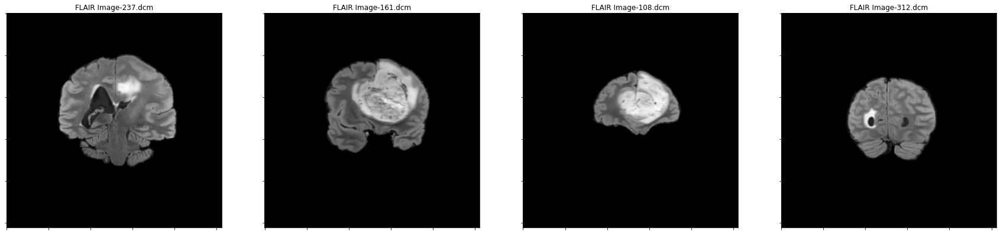

In [236]:
import random

def plots(row = 0, cat = 'FLAIR'):    
    """
    Plots the first five images of a specified category for a given patient.
    
    Args:
    row (int): Index of the patient in the training data.
    cat (str): Category of MRI images to display.
    training_data (DataFrame): DataFrame containing the training data.
    data_path (str): Base path where the data is stored.
    """
    folder = str(training_data.loc[row, 'BraTS21ID']).zfill(5)
    file_path = ''.join([data_path, 'train/', folder, '/', cat, '/'])
    images = os.listdir(file_path)
    
    # Select 5 random images from the list
    selected_images = random.sample(images, 5)   
    
    fig, axs = plt.subplots(1, 4, figsize=(30, 30))
    fig.subplots_adjust(hspace = .2, wspace=.2)
    axs = axs.ravel()
    
    for num in range(4):
        data_file = dicom.dcmread(file_path + selected_images[num])
        img = data_file.pixel_array
        axs[num].imshow(img, cmap='gray')
        axs[num].set_title(cat + ' ' + selected_images[num])
        axs[num].set_xticklabels([])
        axs[num].set_yticklabels([])
        
row = 8
plots(row = row, cat = 'FLAIR')

> # T1w Images 

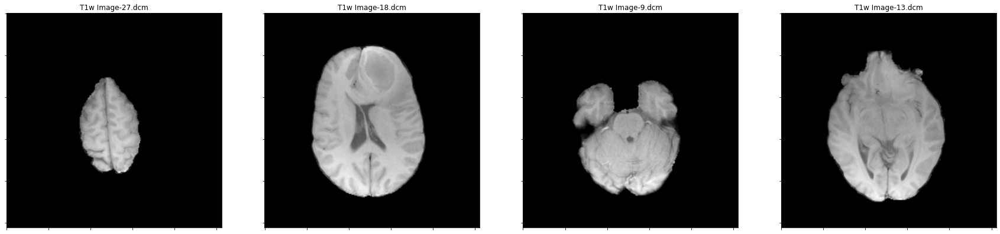

In [211]:
plots(row = row, cat = 'T1w')

> # T1wCE Images 

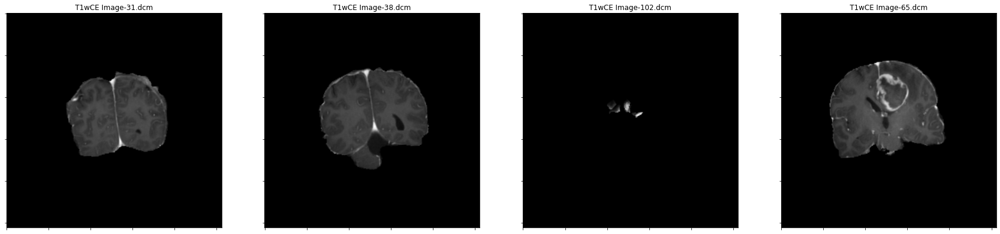

In [207]:
plots(row = 2, cat = 'T1wCE')

> # T2w Images 

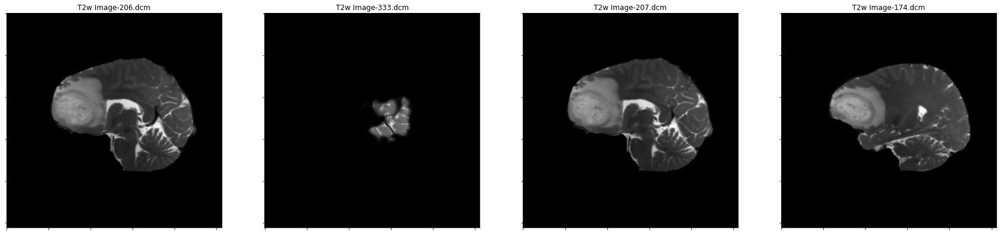

In [206]:
plots(row = row, cat = 'T2w')

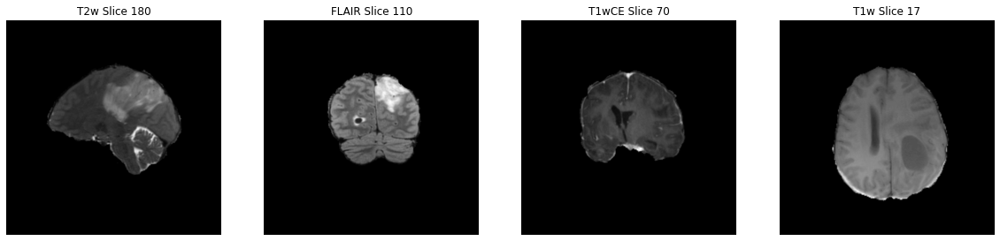

In [203]:
def plot_modalities(patient_id, slice_indices, train_path):
    """
    Plots slices from different modalities for a given patient ID.
    
    Args:
    patient_id (int): Patient ID to fetch images for.
    slice_indices (dict): Dictionary of indices to select which slice to display per modality.
    train_path (str): Base directory path where patient folders are located.
    """
    modalities = ['T2w', 'FLAIR', 'T1wCE', 'T1w']
    fig, axs = plt.subplots(1, len(modalities), figsize=(20, 5))  # Adjust the size as needed
    fig.subplots_adjust(hspace = 0.2, wspace = 0.2)

    for i, modality in enumerate(modalities):
        # Build the path to the directory containing the images for this modality
        modality_path = os.path.join(train_path, str(patient_id).zfill(5), modality)
        
        # Get a sorted list of DICOM files in the modality directory
        dicom_files = sorted(
            glob.glob(os.path.join(modality_path, '*.dcm')), 
            key=lambda x: int(os.path.basename(x).split('-')[-1].split('.')[0])
        )

        slice_index = slice_indices.get(modality, 0)  # Default to first slice if not specified

        if len(dicom_files) > slice_index:
            # Load the DICOM file
            dicom_data = pydicom.dcmread(dicom_files[slice_index])
            img = dicom_data.pixel_array

            # Display the image
            axs[i].imshow(img, cmap='gray')
            axs[i].set_title(f'{modality} Slice {slice_index + 1}')
            axs[i].axis('off')  # Turn off axis numbering and ticks
        else:
            axs[i].text(0.5, 0.5, 'Slice index out of range', fontsize=12, ha='center')
            axs[i].set_title(f'{modality} Slice {slice_index + 1}')
            axs[i].axis('off')
    
    plt.show()

#Example with patient 5
patient_id = 5 
slice_indices = {
    'T2w': 179,
    'FLAIR': 109,
    'T1wCE': 69,
    'T1w': 16  # Replace these indices with the actual slice numbers you wish to use
}

train_path = '/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/train'
plot_modalities(patient_id, slice_indices, train_path)


**Animation visualisation**

In [80]:
from matplotlib import animation, rc
rc('animation', html='jshtml')

def load_dicom(data_path):
    """
    Load and normalize a DICOM image to enhance its contrast for better visibility.
    
    Args:
    data_path (str): The file path to the DICOM image.
    
    Returns:
    numpy.ndarray: The processed DICOM image data as a 2D numpy array.
    """
    dicom = pydicom.read_file(data_path)
    data = dicom.pixel_array
    data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data

def create_animation(ims):
    """
    Create an animation from a list of images.
    
    Args:
    ims (list): A list of numpy arrays representing images.
    
    Returns:
    matplotlib.animation.FuncAnimation: The animation object.
    """
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(ims[0], cmap="gray")

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//24)

def load_dicom_line(data_path):
    """
    Load all DICOM images from a directory and return them as a list.
    
    Args:
    data_path (str): The directory containing DICOM images.
    
    Returns:
    list: A list of loaded and processed images.
    """
    t_paths = sorted(
        glob.glob(os.path.join(data_path, "*")), 
        key=lambda x: int(x[:-4].split("-")[-1]),
    )
    images = []
    for filename in t_paths:
        data = load_dicom(filename)
        if data.max() == 0:
            continue
        images.append(data)
        
    return images

/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/FLAIR


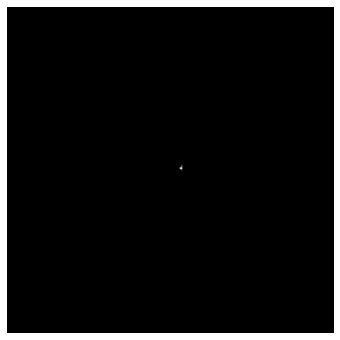

In [81]:
#Create animation
path_file = ''.join([data_path, 'train/', folder, '/FLAIR'])
print(path_file)
images = load_dicom_line(path_file)
create_animation(images)

**Data Preprocessing**

In [82]:
# Exclude bad folders
mri_types = ["FLAIR", "T1w", "T2w", "T1wCE"]
excluded_images = [109, 123, 709] # Bad images
training_data = training_data[~training_data.BraTS21ID.isin(excluded_images)]

In [83]:
def load_dicom(data_path, size = 512):
    """
    Load a DICOM image, normalise and resize it.
    
    Args:
    data_path (str): File path to the DICOM image.
    size (int): The size to which the image should be resized.
    
    Returns:
    numpy.ndarray: Resized image.
    """
    dicom = pydicom.read_file(data_path)
    data = dicom.pixel_array
    # transform data into black and white scale / grayscale
#     data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return cv2.resize(data, (size, size))



def get_all_image_paths(brats21id, image_type, folder='train'): 
    """
    Get paths for all images of a specific type for a given patient ID.
    
    Args:
    brats21id (int): The patient's ID.
    image_type (str): The type of MRI image.
    folder (str): The directory in which to look for images.
    
    Returns:
    numpy.ndarray: Array of file paths for the images.
    """
    assert(image_type in mri_types)
    
    patient_path = os.path.join(
        "../input/rsna-miccai-brain-tumor-radiogenomic-classification/%s/" % folder, 
        str(brats21id).zfill(5),
    )

    paths = sorted(
        glob.glob(os.path.join(patient_path, image_type, "*")), 
        key=lambda x: int(x[:-4].split("-")[-1]),
    )
    
    num_images = len(paths)
    
    start = int(num_images * 0.25)
    end = int(num_images * 0.75)

    interval = 3
    
    if num_images < 10: 
        interval = 1
    
    return np.array(paths[start:end:interval])

def get_all_images(brats21id, image_type, folder='train', size=225):
    """
    Load and resize all images of a specific type for a given patient ID.
    
    Args:
    brats21id (int): The patient's ID.
    image_type (str): The type of MRI image.
    folder (str): The folder where the patient's images are stored.
    size (int): The new size for the images.
    
    Returns:
    list: A list of processed images.
    """
    return [load_dicom(path, size) for path in get_all_image_paths(brats21id, image_type, folder)]


In [84]:
def get_all_data_for_train(image_type, training_data, image_size=400):
    """
    Retrieves all images for each patient, labels them, and prepares the training dataset.
    
    Args:
    image_type (str): The type of MRI image (e.g., 'FLAIR', 'T1w').
    training_data (DataFrame): DataFrame containing patient IDs and labels.
    image_size (int): The size to resize images to.
    
    Returns:
    tuple: A tuple containing arrays for images, labels, and patient IDs.
    """    
    X = []
    y = []
    train_ids = []

    for i in tqdm(training_data.index):
        x = training_data.loc[i]
        images = get_all_images(int(x['BraTS21ID']), image_type, 'train', image_size)
        label = x['MGMT_value']

        X += images
        y += [label] * len(images)
        train_ids += [int(x['BraTS21ID'])] * len(images)
        assert(len(X) == len(y))
    return np.array(X), np.array(y), np.array(train_ids)

**Loading the training Data**

We will just use the T2w filter for this model prediction

In [85]:
# Retrieve all training data for a specific MRI type (here, T2w images)
X, y, trainidt = get_all_data_for_train('T2w',training_data, image_size=128)

  0%|          | 0/582 [00:00<?, ?it/s]

In [88]:
# Print data shape
X.shape, y.shape, trainidt.shape

((16813, 128, 128), (16813,), (16813,))

Split the data into train,test and one hot encode the MGMT to predict

In [97]:
# Split the dataset into training and testing sets, along with their identifiers.
X_train, X_test, y_train, y_test, trainidt_train, trainidt_valid = train_test_split(X, y, trainidt, random_state=12)

In [98]:
# Print training data shape
X_train.shape

(12609, 128, 128)

In [99]:
# Expand the dimensions of training and testing sets for TensorFlow compatibility.
# This is required as TensorFlow expects input with 4 dimensions (including the channel).
X_train = tf.expand_dims(X_train, axis=-1)
X_test = tf.expand_dims(X_test, axis=-1)

# Convert the training and testing labels to one-hot encoded vectors to use with categorical_crossentropy.
y_train = to_categorical(y_train)
y_test = to_categorical(y_test) 

In [126]:
# Print expanded training data shape
X_train.shape

TensorShape([12609, 128, 128, 1])

In [152]:
# Import necessary callbacks for model training from TensorFlow Keras.
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping

# Define the baseline model-building function.
def build_model_baseline():
    """
    Builds and returns the baseline model.
    
    Args:
    input_shape (tuple): Shape of the input data used to define input layer shape.
    
    Returns:
    keras.Model: Compiled baseline model.
    """
    np.random.seed(0)  # Set the seed for numpy's random number generator
    random.seed(12)  # Set the seed for python's random module
    tf.random.set_seed(12)  # Set the seed for tensorflow's random number generator

    # Define the input layer, create a simple CNN architecture, and compile the model.
    inpt = keras.Input(shape=X_train.shape[1:])
    h = keras.layers.Conv2D(32, kernel_size=(4, 4), activation="relu", name="Conv_1")(inpt)
    h = keras.layers.Flatten()(h)
    output = keras.layers.Dense(2, activation="softmax")(h)

    model = keras.Model(inpt, output)

    model.compile(
        loss="binary_crossentropy",  
        optimizer="adam", 
        metrics=[tf.keras.metrics.AUC(name='auc')] 
    )
    
    return model

# Instantiate the model using the function you've defined.
model_instance = build_model_baseline()

# Set up TensorBoard callback for visualization of training progress.
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Set up EarlyStopping callback to prevent overfitting by stopping early if 'auc' doesn't improve.
early_stopping_callback = EarlyStopping(monitor='auc', patience=10, mode='max', restore_best_weights=True)

# Train the model with the defined callbacks for monitoring.
history = model_instance.fit(x=X_train, y=y_train,
                    epochs=40,
                    callbacks=[tensorboard_callback, early_stopping_callback])

Epoch 1/40
395/395 [==============================] - 4s 9ms/step - loss: 26.8524 - auc: 0.6471
Epoch 2/40
395/395 [==============================] - 3s 8ms/step - loss: 0.3442 - auc: 0.9356
Epoch 3/40
395/395 [==============================] - 3s 8ms/step - loss: 0.2191 - auc: 0.9751
Epoch 4/40
395/395 [==============================] - 3s 8ms/step - loss: 0.0532 - auc: 0.9992
Epoch 5/40
395/395 [==============================] - 3s 8ms/step - loss: 0.0311 - auc: 0.9996
Epoch 6/40
395/395 [==============================] - 3s 8ms/step - loss: 0.0134 - auc: 1.0000
Epoch 7/40
395/395 [==============================] - 3s 8ms/step - loss: 0.0095 - auc: 1.0000
Epoch 8/40
395/395 [==============================] - 3s 8ms/step - loss: 0.0218 - auc: 0.9999
Epoch 9/40
395/395 [==============================] - 3s 8ms/step - loss: 0.0558 - auc: 0.9998
Epoch 10/40
395/395 [==============================] - 3s 8ms/step - loss: 0.0267 - auc: 1.0000
Epoch 11/40
395/395 [===========================

In [113]:
# Load the TensorBoard notebook extension.
%reload_ext tensorboard

# Start the TensorBoard within the notebook using the specified log directory.
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 104), started 0:02:57 ago. (Use '!kill 104' to kill it.)

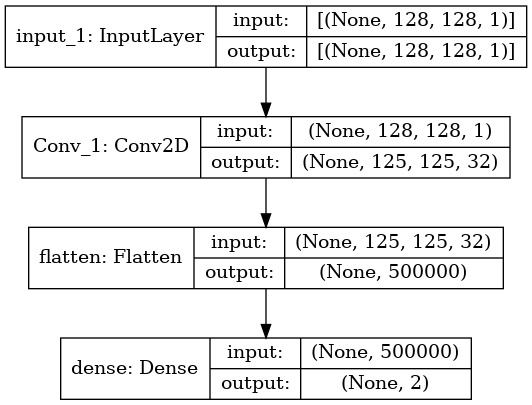

In [107]:
# Creates a visualisation of the model architecture and saves the image
from keras.utils import plot_model
plot_model(model_baseline, to_file='model_baseline.png', show_shapes=True, show_layer_names=True)

In [153]:
# Evaluate baseline model on test data
y_pred_baseline = model_baseline.predict(X_test)

# Calculate AUC score
auc_baseline = roc_auc_score(y_test, y_pred_baseline)

print(f"AUC for baseline model: {auc_baseline}")

AUC for baseline model: 0.8736507331551036


**Baseline Model with data augmentation**

In [165]:
def model_baseline_data_augmentation():
    """
    Builds and returns the baseline model with data augmentation layers.
    
    Args:
    input_shape (tuple): Shape of the input data used to define the input layer shape.
    
    Returns:
    keras.Model: Compiled model with data augmentation.
    """
    
    np.random.seed(0)
    random.seed(12)
    tf.random.set_seed(12)

    inpt = keras.Input(shape=X_train.shape[1:])
    
    # Data augmentation layers
    data_augmentation = keras.Sequential([
        keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
        keras.layers.experimental.preprocessing.RandomRotation(0.3),
        keras.layers.experimental.preprocessing.RandomZoom(0.2),
    ], name="data_augmentation")
    
    # Apply data augmentation to the input
    h = data_augmentation(inpt)
    
    # Normalize the image data to 0-1 range    
    h = keras.layers.experimental.preprocessing.Rescaling(1.0 / 255)(inpt)
    
    # Convolutional layer
    h = keras.layers.Conv2D(64, kernel_size=(4, 4), activation="relu", name="Conv_1")(h)
    h = keras.layers.Flatten()(h)

    # Output layer with softmax activation for classification
    output = keras.layers.Dense(2, activation="softmax")(h)

    model = keras.Model(inpt, output)

    model.compile(
        loss="binary_crossentropy", optimizer="adam", metrics=[tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Create a model instance using the defined function.
model_baseline_data_augmentation = model_baseline_data_augmentation()

# Set up TensorBoard callback for visualization of training progress.
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Callback EarlyStopping
early_stopping_callback = EarlyStopping(monitor='auc', patience=10, mode='max', restore_best_weights=True)

# Train the model with the defined callbacks for monitoring.
history = model_baseline_data_augmentation.fit(x=X_train, y=y_train,
                    epochs=40,
                    callbacks=[tensorboard_callback, early_stopping_callback])

Epoch 1/40
395/395 [==============================] - 7s 17ms/step - loss: 0.6892 - auc: 0.6557
Epoch 2/40
395/395 [==============================] - 5s 14ms/step - loss: 0.4411 - auc: 0.8829
Epoch 3/40
395/395 [==============================] - 5s 14ms/step - loss: 0.3094 - auc: 0.9472
Epoch 4/40
395/395 [==============================] - 6s 14ms/step - loss: 0.1937 - auc: 0.9833
Epoch 5/40
395/395 [==============================] - 5s 14ms/step - loss: 0.1219 - auc: 0.9947
Epoch 6/40
395/395 [==============================] - 5s 14ms/step - loss: 0.0760 - auc: 0.9984
Epoch 7/40
395/395 [==============================] - 5s 14ms/step - loss: 0.0541 - auc: 0.9992
Epoch 8/40
395/395 [==============================] - 5s 14ms/step - loss: 0.0287 - auc: 0.9999
Epoch 9/40
395/395 [==============================] - 6s 14ms/step - loss: 0.0192 - auc: 1.0000
Epoch 10/40
395/395 [==============================] - 5s 14ms/step - loss: 0.0147 - auc: 1.0000
Epoch 11/40
395/395 [==================

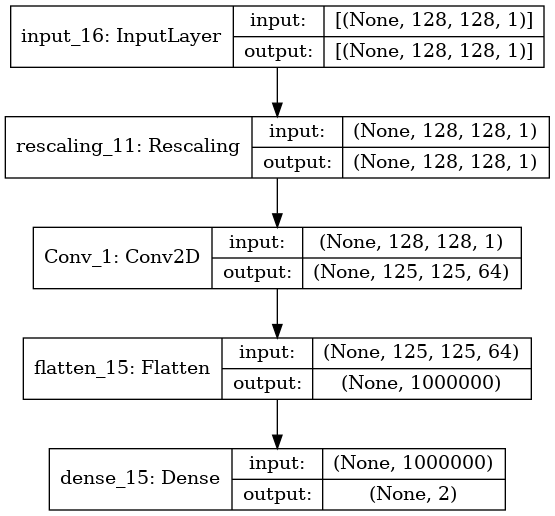

In [148]:
# Creates a visualisation of the model architecture and saves the image
plot_model(model_baseline_data_augmentation, to_file='model_data_aug.png', show_shapes=True,show_layer_names=True)

In [166]:
# Evaluate baseline model with data augmentation on test data
y_pred_augmentation = model_baseline_data_augmentation.predict(X_test)

# Calculate AUC score
auc_augmentation = roc_auc_score(y_test, y_pred_augmentation)

print(f"AUC for baseline model with data augmentation: {auc_augmentation}")

AUC for baseline model with data augmentation: 0.8891496513668854


# Transfer Learning for Brain Tumor Radiogenomic Classification

In [157]:
# Convert grayscale images to RGB since the VGG16 model expects 3 channels.
images_rgb = tf.image.grayscale_to_rgb(X_train)

# Resize the images to the size expected by the VGG16 model input (224x224).
images_resized = tf.image.resize(images_rgb, [224, 224])

# Repeat the grayscale to RGB conversion for the test set images.
images_rgb_test = tf.image.grayscale_to_rgb(X_test)

# Resize the test set images to the size expected by the VGG16 model input (224x224).
images_resized_test = tf.image.resize(images_rgb_test, [224, 224])


In [158]:
# Import the necessary components for constructing the model.
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense

# Load the pre-trained VGG16 model without the top layer (fully connected layers) on the ImageNet dataset.
model = VGG16(include_top=False, input_shape=(224, 224, 3), weights='imagenet')

# We will use this base model (VGG16) as the starting point.
base_model = model

# Set the layers of the base model to not trainable to preserve the learned ImageNet features.
for layer in base_model.layers:
    layer.trainable = False

# Build the new model by adding a flatten layer and two dense layers on top of the base model.
model = Sequential([
    base_model,
    Flatten(),
    Dense(1024, activation='relu'), 
    Dense(2, activation="softmax") 
])

# Compile the model with the Adam optimizer, binary cross-entropy loss, and AUC as a performance metric.
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=[tf.keras.metrics.AUC(name='auc')])

# Set up TensorBoard callback for monitoring the model training.
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Set up EarlyStopping callback to halt training early if 'auc' metric stops improving.
early_stopping_callback = EarlyStopping(monitor='auc', patience=10, mode='max', restore_best_weights=True)

# Train the model using the processed images, with callbacks for TensorBoard and EarlyStopping.
history = model.fit(x=images_resized, y=y_train,
                    epochs=40,
                    callbacks=[tensorboard_callback, early_stopping_callback])

58892288/58889256 [==============================] - 0s 0us/step
Epoch 1/40
395/395 [==============================] - 31s 69ms/step - loss: 6.2408 - auc: 0.6283
Epoch 2/40
395/395 [==============================] - 27s 68ms/step - loss: 0.4744 - auc: 0.8556
Epoch 3/40
395/395 [==============================] - 27s 67ms/step - loss: 0.3797 - auc: 0.9091
Epoch 4/40
395/395 [==============================] - 27s 67ms/step - loss: 0.3628 - auc: 0.9162
Epoch 5/40
395/395 [==============================] - 27s 67ms/step - loss: 0.2131 - auc: 0.9712
Epoch 6/40
395/395 [==============================] - 27s 67ms/step - loss: 0.1793 - auc: 0.9782
Epoch 7/40
395/395 [==============================] - 27s 67ms/step - loss: 0.1839 - auc: 0.9761
Epoch 8/40
395/395 [==============================] - 27s 67ms/step - loss: 0.3868 - auc: 0.9299
Epoch 9/40
395/395 [==============================] - 26s 67ms/step - loss: 0.1076 - auc: 0.9918
Epoch 10/40
395/395 [==============================] - 26s 67m

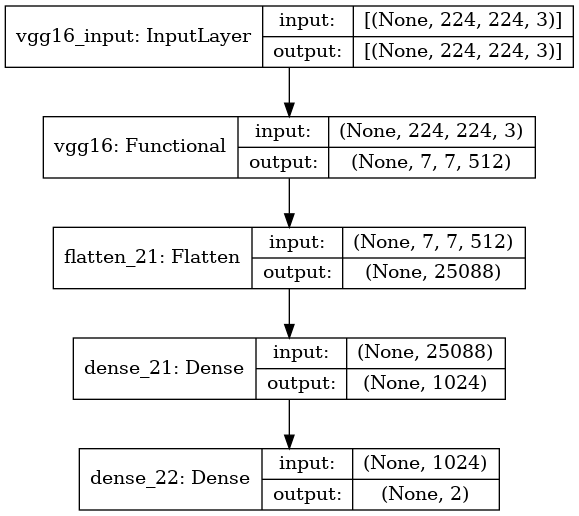

In [159]:
# Creates a visualisation of the model architecture and saves the image
plot_model(model, to_file='model_vgg16.png', show_shapes=True,show_layer_names=True)

**Comparison of the results**

In [168]:
# Predict the probabilities on the test set for each model.
y_pred_baseline = model_baseline.predict(X_test)  # Baseline model predictions.
y_pred_augmentation = model_baseline_data_augmentation.predict(X_test)  # Data augmentation model predictions.
y_pred_vgg = model.predict(images_resized_test)  # VGG16-based model predictions.

# Calculate AUC scores to evaluate the performance of each model.
auc_baseline = roc_auc_score(y_test, y_pred_baseline)  # AUC for the baseline model.
auc_augmentation = roc_auc_score(y_test, y_pred_augmentation)  # AUC for the data augmentation model.
auc_vgg_16 = roc_auc_score(y_test, y_pred_vgg)  # AUC for the VGG16-based model.

# Print the AUC scores for each model.
print(f"AUC for baseline model: {auc_baseline}")
print(f"AUC for baseline model with data augmentation: {auc_augmentation}")
print(f"AUC for VGG16: {auc_vgg_16}")

AUC for baseline model: 0.8736507331551036
AUC for baseline model with data augmentation: 0.8891496513668854
AUC for VGG16: 0.9386527831164209


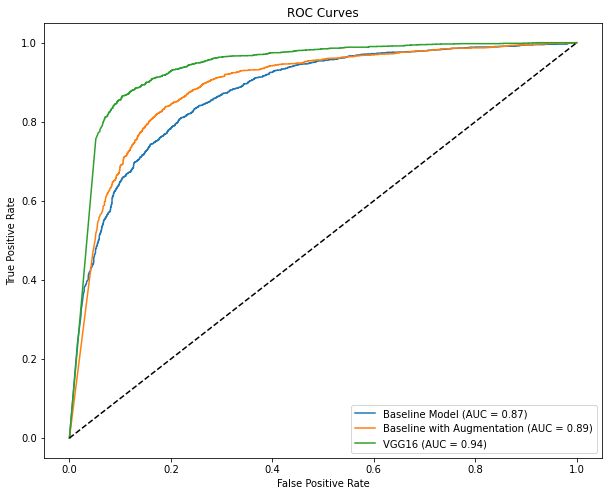

Baseline Model - Precision: 0.82, Recall: 0.83, F1 Score: 0.83, Accuracy: 0.80
Baseline with Augmentation - Precision: 0.84, Recall: 0.87, F1 Score: 0.85, Accuracy: 0.83
VGG16 - Precision: 0.89, Recall: 0.91, F1 Score: 0.90, Accuracy: 0.88


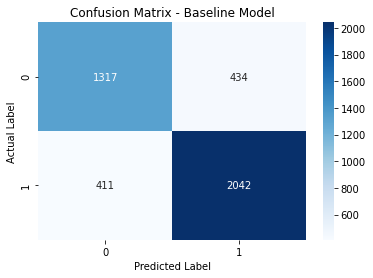

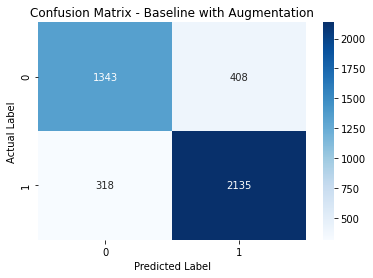

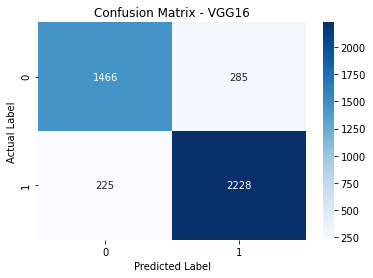

In [169]:
# Convert y_test to scalar labels
y_test_labels = y_test.argmax(axis=1)

# Calculate ROC curves and AUC for each model
fpr_baseline, tpr_baseline, _ = roc_curve(y_test_labels, y_pred_baseline[:, 1])
auc_baseline = auc(fpr_baseline, tpr_baseline)

fpr_augmentation, tpr_augmentation, _ = roc_curve(y_test_labels, y_pred_augmentation[:, 1])
auc_augmentation = auc(fpr_augmentation, tpr_augmentation)

fpr_vgg_16, tpr_vgg_16, _ = roc_curve(y_test_labels, y_pred_vgg[:, 1])
auc_vgg_16 = auc(fpr_vgg_16, tpr_vgg_16)

# Plot ROC curves
plt.figure(figsize=(10, 8))
plt.plot(fpr_baseline, tpr_baseline, label=f'Baseline Model (AUC = {auc_baseline:.2f})')
plt.plot(fpr_augmentation, tpr_augmentation, label=f'Baseline with Augmentation (AUC = {auc_augmentation:.2f})')
plt.plot(fpr_vgg_16, tpr_vgg_16, label=f'VGG16 (AUC = {auc_vgg_16:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # line of no skill
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.show()

def display_metrics(y_true, y_preds, model_names):
    """
    Displays precision, recall, F1-score, and accuracy for each model.
    
    Args:
    y_true (np.array): True labels.
    y_preds (list of np.array): List of predictions from different models.
    model_names (list of str): Names of the models corresponding to the predictions.
    """
    for y_pred, name in zip(y_preds, model_names):
        y_pred_labels = np.argmax(y_pred, axis=1)
        accuracy = accuracy_score(y_true, y_pred_labels)
        precision = precision_score(y_true, y_pred_labels)
        recall = recall_score(y_true, y_pred_labels)
        f1 = f1_score(y_true, y_pred_labels)
        print(f"{name} - Precision: {precision:.2f}, Recall: {recall:.2f}, F1 Score: {f1:.2f}, Accuracy: {accuracy:.2f}")

# Display metrics for each model
display_metrics(y_test_labels, [y_pred_baseline, y_pred_augmentation, y_pred_vgg], ['Baseline Model', 'Baseline with Augmentation', 'VGG16'])

def plot_confusion_matrix(y_true, y_pred, title):
    """
    Plots a confusion matrix for the given true labels and predictions.
    
    Args:
    y_true (np.array): True labels.
    y_pred (np.array): Predictions.
    title (str): Title for the confusion matrix plot.
    """
    cm = confusion_matrix(y_true, np.argmax(y_pred, axis=1))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(title)
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')
    plt.show()

#Plot confusion matrices
plot_confusion_matrix(y_test_labels, y_pred_baseline, 'Confusion Matrix - Baseline Model')
plot_confusion_matrix(y_test_labels, y_pred_augmentation, 'Confusion Matrix - Baseline with Augmentation')
plot_confusion_matrix(y_test_labels, y_pred_vgg, 'Confusion Matrix - VGG16')


**Measure Inference Times**

In [128]:
# Baseline model
start_time1 = time.time()
output1 = model_baseline.predict(X_train)
end_time1 = time.time()

# Baseline + data augmentation model
start_time2 = time.time()
output2 = model_baseline_data_augmentation.predict(X_train)
end_time2 = time.time()

# VGG16 model
start_time3 = time.time()
output3 = model.predict(images_resized)
end_time3 = time.time()

print(f"Inference time BM: {end_time1 - start_time1} seconds")
print(f"Inference time BM-DA: {end_time2 - start_time2} seconds")
print(f"Inference time VGG16: {end_time3 - start_time3} seconds")

Inference time BM: 1.3896734714508057 seconds
Inference time BM-DA: 2.807225465774536 seconds
Inference time VGG16: 23.41071891784668 seconds


**Print Model Summaries for Comparison**

In [170]:
# Print model summaries
model_baseline.summary()
model_baseline_data_augmentation.summary()
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 1)]     0         
_________________________________________________________________
Conv_1 (Conv2D)              (None, 125, 125, 32)      544       
_________________________________________________________________
flatten (Flatten)            (None, 500000)            0         
_________________________________________________________________
dense (Dense)                (None, 2)                 1000002   
Total params: 1,000,546
Trainable params: 1,000,546
Non-trainable params: 0
_________________________________________________________________
Model: "model_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 128, 128, 1)]     0         
_________________________________

**Save model weights**

In [174]:
# Save the models' weights
model_baseline.save('model_baseline.h5')

In [175]:
model_baseline_data_augmentation.save('model_baseline_data_augmentation.h5')

In [176]:
model.save('model_vgg16.h5')